In [20]:
!pip install prophet


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: pip install --upgrade pip


In [21]:
import pandas as pd
from prophet import Prophet
import datetime

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [22]:
df_BTC = pd.read_csv('final_BTCUSDT.csv')
df_BTC.head()

,open_time,close_time,open,high,low,close,volume,quote_asset_volume,num_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore,open_timestamp,close_timestamp,symbol,currency
0,"12/31/2021, 23:00:00","12/31/2021, 23:59:59",46303.98,46520.13,46132.04,46216.93,985.99762,4.571976e+07,29555,484.09229,2.244919e+07,0,1640991600000,1640995199999,BTC,USDT
1,"12/31/2021, 22:00:00","12/31/2021, 22:59:59",46333.87,46569.97,46232.36,46303.99,991.85142,4.600406e+07,36280,447.96605,2.077702e+07,0,1640988000000,1640991599999,BTC,USDT
2,"12/31/2021, 21:00:00","12/31/2021, 21:59:59",45886.66,46513.67,45766.85,46333.86,1734.69585,7.997065e+07,54579,972.44065,4.482430e+07,0,1640984400000,1640987999999,BTC,USDT
3,"12/31/2021, 20:00:00","12/31/2021, 20:59:59",45728.28,46211.07,45678.00,45879.24,1831.41202,8.422142e+07,51300,997.72369,4.588270e+07,0,1640980800000,1640984399999,BTC,USDT
4,"12/31/2021, 19:00:00","12/31/2021, 19:59:59",46686.42,46688.68,45678.96,45728.28,3851.30902,1.776171e+08,87472,1691.64542,7.803749e+07,0,1640977200000,1640980799999,BTC,USDT


In [24]:
df_BTC['close_datetime'] = pd.to_datetime(df_BTC['close_time'])

In [25]:
df_BTC.close_datetime.max()

Timestamp('2023-06-06 23:59:59')

In [26]:
df_BTC = df_BTC[df_BTC['close_datetime'] < df_BTC.close_datetime.max() - datetime.timedelta(days = 60)]

In [27]:
df_BTC.close_datetime.max()

Timestamp('2023-04-07 22:59:59')

In [31]:
df_BTC_fbp = df_BTC[['close_datetime', 'close']].rename(columns={"close_datetime": "ds", "close": "y"})

In [32]:
m=Prophet()
m.fit(df_BTC_fbp)

14:25:43 - cmdstanpy - INFO - Chain [1] start processing
14:26:09 - cmdstanpy - INFO - Chain [1] done processing


In [42]:
future = m.make_future_dataframe(periods=1440, freq='H')
future.tail()

,ds
21268,2023-06-06 18:59:59
21269,2023-06-06 19:59:59
21270,2023-06-06 20:59:59
21271,2023-06-06 21:59:59
21272,2023-06-06 22:59:59


In [43]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
21268,2023-06-06 18:59:59,11899.719367,-3967.451369,27453.303718
21269,2023-06-06 19:59:59,11903.577559,-3977.267562,27859.310095
21270,2023-06-06 20:59:59,11909.997459,-3808.467072,27231.437734
21271,2023-06-06 21:59:59,11919.947471,-3494.867443,27162.592327
21272,2023-06-06 22:59:59,11932.536894,-4305.572675,27711.887264


In [44]:
fig1 = m.plot(forecast)


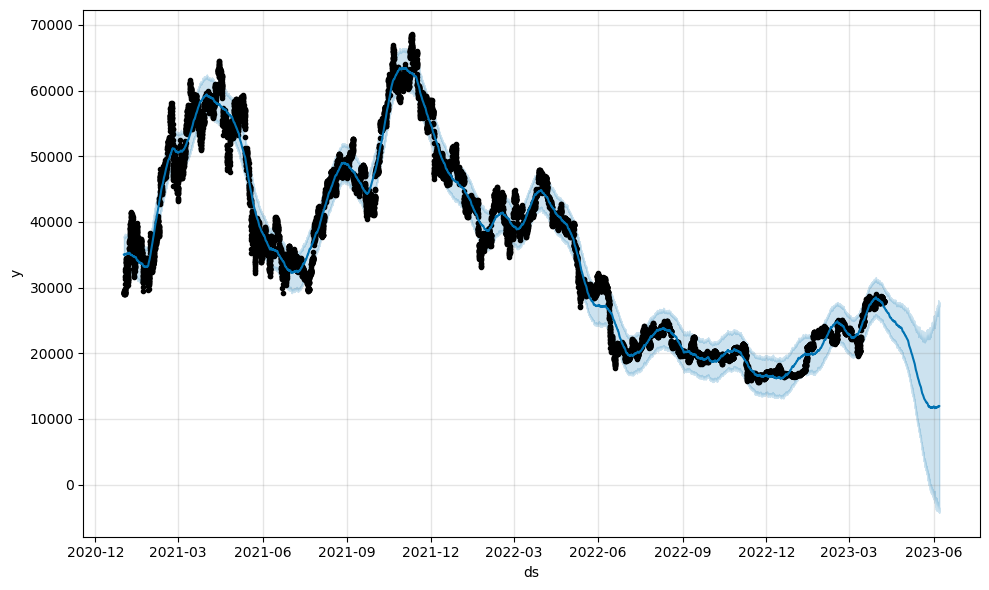

In [45]:
fig1

In [46]:
fig2 = m.plot_components(forecast)


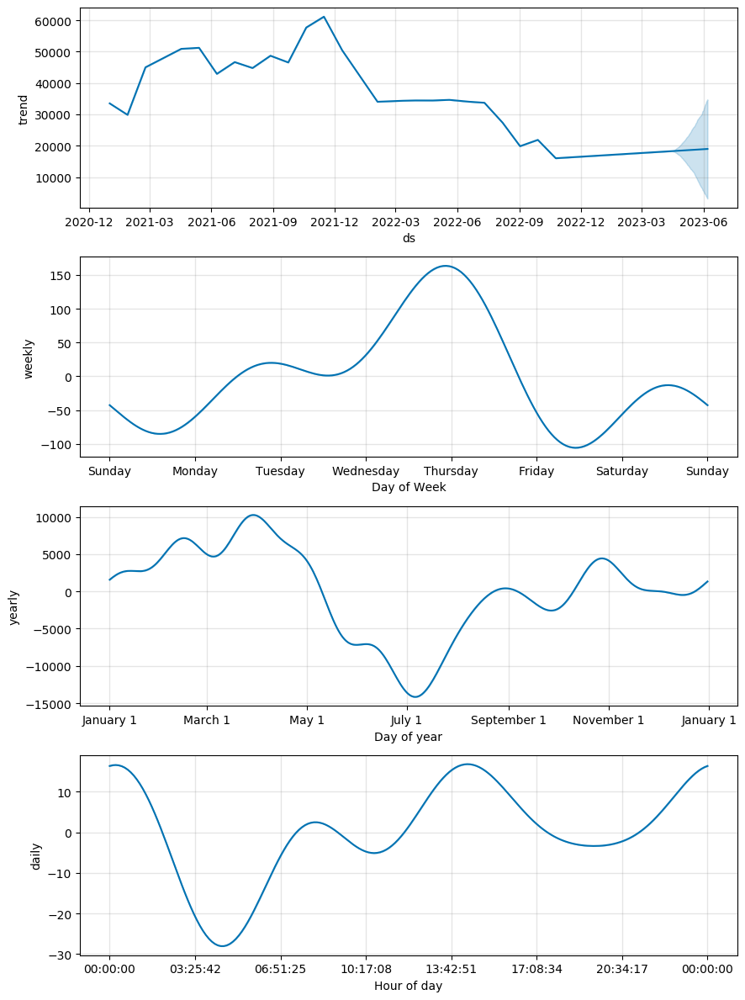

In [47]:
fig2

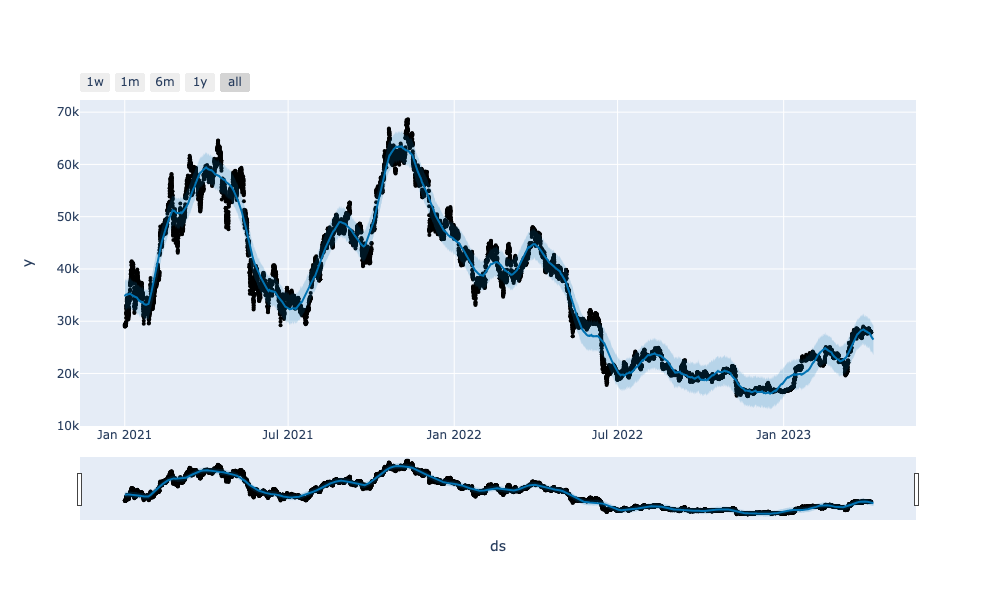

In [41]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)